In [ ]:
import urllib.request
import re

# URL of the webpage
webpage_url = "https://prod-thaf-vision.edf.fr/PIVision/#/Displays/1788"

# Fetch the webpage content
try:
    with urllib.request.urlopen(webpage_url) as response:
        html_content = response.read().decode('utf-8')
except Exception as e:
    print(f"Error fetching the webpage: {e}")
    exit()

# Regular expression to extract href links
# Matches patterns like <a href="URL">
link_pattern = r'href=["\'](.*?)["\']'
links = re.findall(link_pattern, html_content)

# Print all extracted links
for link in links:
    print(link)


In [13]:
from collections import deque
from html.parser import HTMLParser
from threading import Lock
from urllib.error import HTTPError
from urllib.parse import urljoin
from urllib.request import urlopen
from concurrent.futures import ThreadPoolExecutor

NUMBER_OF_THREADS = 10
MAX_DEPTH = 3
TARGET_URL = "https://prod-thaf-vision.edf.fr/PIVision/#/Displays/1788"


class MyHTMLParser(HTMLParser):
    def __init__(self, url=None):
        super().__init__()
        self.links = []
        self.url = url

    def handle_starttag(self, tag, attrs):
        if tag == "a":
            if "href" not in dict(attrs):
                return

            href = dict(attrs)["href"]

            # Convert relative links to absolute links
            if self.url:
                href = urljoin(self.url, href)

            self.links.append(href)


def get_html(url):
    """
    Get the content of a URL.
    """
    try:
        return urlopen(url).read().decode("utf-8")
    except HTTPError as e:
        return e.read().decode("utf-8")



def parse_html(html, url=None):
    """
    Parse the HTML of a web page.
    """
    parser = MyHTMLParser(url)
    parser.feed(html)
    return parser


def handle(url, depth, callback, lock):
    """
    Handle a web page.
    """
    html = get_html(url)
    links = parse_html(html, url).links

    # Lock when printing to the terminal to avoid two threads printing at the same time
    with lock:
        print(depth, url)

    for link in links:
        # Lock when adding to the queue to avoid two threads adding to the queue at the same time
        with lock:
            callback((depth + 1, link))


def crawl(url, max_depth):
    """
    Crawl a web page.
    """
    seen = set()
    crawling = deque([(0, url)])
    lock = Lock()
    with ThreadPoolExecutor(max_workers=NUMBER_OF_THREADS) as executor:
        tasks = []
        while crawling:
            depth, url = crawling.popleft()

            # If the depth is equal to the maximum depth, skip the URL (remember depth starts at 0)
            if depth == max_depth:
                continue

            # If the URL has already been seen, skip it
            if url in seen:
                continue
            seen.add(url)

            # Submit the task and add the task to the list of tasks
            tasks.append(executor.submit(handle, url, depth, crawling.append, lock))

            # If the queue is empty and we still have tasks, wait for them one by one until we have something to do
            while tasks and not crawling:
                tasks.pop().result()


if __name__ == "__main__":
    crawl(TARGET_URL, max_depth=MAX_DEPTH)

0 https://prod-thaf-vision.edf.fr/PIVision/#/Displays/1788


In [14]:
from collections import deque
from html.parser import HTMLParser
from threading import Lock
from urllib.error import HTTPError, URLError
from urllib.parse import urljoin
from urllib.request import urlopen
from concurrent.futures import ThreadPoolExecutor
import logging

# Configuration
NUMBER_OF_THREADS = 10
MAX_DEPTH = 3
TARGET_URL = "https://prod-thaf-vision.edf.fr/PIVision/#/Displays/1788"

# Set up logging
logging.basicConfig(level=logging.INFO, format="%(threadName)s - %(message)s")


class MyHTMLParser(HTMLParser):
    def __init__(self, base_url=None):
        super().__init__()
        self.links = []
        self.base_url = base_url

    def handle_starttag(self, tag, attrs):
        if tag == "a":
            href = dict(attrs).get("href")
            if href:
                # Convert relative links to absolute links
                href = urljoin(self.base_url, href)
                # Filter out non-HTTP(S) links
                if href.startswith("http://") or href.startswith("https://"):
                    self.links.append(href)


def get_html(url):
    """
    Fetch the HTML content of a URL.
    """
    try:
        with urlopen(url) as response:
            return response.read().decode("utf-8")
    except (HTTPError, URLError) as e:
        logging.error(f"Failed to fetch {url}: {e}")
        return None


def parse_html(html, base_url):
    """
    Parse the HTML of a webpage to extract links.
    """
    parser = MyHTMLParser(base_url)
    parser.feed(html)
    return parser.links


def handle(url, depth, callback, lock, seen):
    """
    Process a single URL: fetch its content and extract links.
    """
    logging.info(f"Processing: Depth {depth} - {url}")
    html = get_html(url)
    if not html:
        return

    links = parse_html(html, url)
    for link in links:
        with lock:
            if link not in seen:
                seen.add(link)
                callback((depth + 1, link))


def crawl(start_url, max_depth):
    """
    Crawl starting from a URL up to a maximum depth.
    """
    seen = set()
    crawling = deque([(0, start_url)])
    lock = Lock()

    with ThreadPoolExecutor(max_workers=NUMBER_OF_THREADS) as executor:
        tasks = []
        while crawling:
            depth, url = crawling.popleft()

            # Skip URLs that exceed max depth
            if depth >= max_depth:
                continue

            # Submit tasks to the executor
            tasks.append(executor.submit(handle, url, depth, crawling.append, lock, seen))

            # Ensure tasks complete when no new URLs are being added
            while tasks and not crawling:
                tasks.pop().result()


if __name__ == "__main__":
    crawl(TARGET_URL, MAX_DEPTH)


ThreadPoolExecutor-7_0 - Processing: Depth 0 - https://prod-thaf-vision.edf.fr/PIVision/#/Displays/1788
ThreadPoolExecutor-7_0 - Failed to fetch https://prod-thaf-vision.edf.fr/PIVision/#/Displays/1788: HTTP Error 401: Unauthorized


In [1]:
from bs4 import BeautifulSoup
from urllib.request import urlopen
from urllib.error import HTTPError

TARGET_URL = "https://prod-thaf-vision.edf.fr/PIVision/#/Displays/1788"

def fetch_html(url):
    """
    Fetch HTML content from the URL.
    """
    try:
        with urlopen(url) as response:
            return response.read().decode("utf-8")
    except HTTPError as e:
        print(f"Failed to fetch {url}: {e}")
        return None

def extract_title_from_div(html):
    """
    Extract the 'title' attribute from the target div.
    """
    soup = BeautifulSoup(html, "html.parser")
    # Find the div with the target class
    target_div = soup.find("div", class_="symbol-mouse-drop symbol-host editor-symbol-host shape ui-droppable")
    if target_div and target_div.has_attr("title"):
        return target_div["title"]
    return None

if __name__ == "__main__":
    html_content = fetch_html(TARGET_URL)
    if html_content:
        title = extract_title_from_div(html_content)
        if title:
            print(f"Title attribute: {title}")
        else:
            print("The specified div or its title attribute was not found.")


Failed to fetch https://prod-thaf-vision.edf.fr/PIVision/#/Displays/1788: HTTP Error 401: Unauthorized


In [2]:
import requests
from bs4 import BeautifulSoup

LOGIN_URL = "https://prod-thaf-vision.edf.fr/login"
TARGET_URL = "https://prod-thaf-vision.edf.fr/PIVision/#/Displays/1788"

# Replace with your login payload
LOGIN_PAYLOAD = {
    "username": "your_username",
    "password": "your_password",
}

def login_and_fetch_html(login_url, target_url, payload):
    """
    Log in to the website and fetch the target page.
    """
    with requests.Session() as session:
        # Log in to the site
        login_response = session.post(login_url, data=payload)
        if login_response.status_code != 200:
            print(f"Login failed: {login_response.status_code} {login_response.reason}")
            return None
        
        # Fetch the target page
        response = session.get(target_url)
        if response.status_code == 200:
            return response.text
        else:
            print(f"Failed to fetch {target_url}: {response.status_code} {response.reason}")
            return None

def extract_title_from_div(html):
    """
    Extract the 'title' attribute from the target div.
    """
    soup = BeautifulSoup(html, "html.parser")
    target_div = soup.find("div", class_="symbol-mouse-drop symbol-host editor-symbol-host shape ui-droppable")
    if target_div and target_div.has_attr("title"):
        return target_div["title"]
    return None

if __name__ == "__main__":
    html_content = login_and_fetch_html(LOGIN_URL, TARGET_URL, LOGIN_PAYLOAD)
    if html_content:
        title = extract_title_from_div(html_content)
        if title:
            print(f"Title attribute: {title}")
        else:
            print("The specified div or its title attribute was not found.")


SSLError: HTTPSConnectionPool(host='prod-thaf-vision.edf.fr', port=443): Max retries exceeded with url: /login (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1000)')))

ID: Symbol5
title: 
Outer HTML: <div class="symbol-mouse-drop symbol-host editor-symbol-host shape ui-droppable" id="Symbol5" style="position: absolute; left: 0.955161px; top: 41.69px; width: 1931.2px; height: 4px; transform: rotate(0deg); z-index: auto;" title=""> <div class="symbol-template-parent"><svg style="position: absolute; height: 100%; width: 100%; top: 0px; left: 0px; overflow: visible; color: rgb(205, 208, 219);" stroke-width="12"><path d="M0,2 L1929.2,0" stroke="currentColor" stroke-dasharray=""></path></svg></div>
</div>
Inner HTML: <div class="symbol-template-parent"><svg style="position: absolute; height: 100%; width: 100%; top: 0px; left: 0px; overflow: visible; color: rgb(205, 208, 219);" stroke-width="12"><path d="M0,2 L1929.2,0" stroke="currentColor" stroke-dasharray=""></path></svg></div>

Div sousjacent: ['symbol-template-parent']
Text:No text found

ID: Symbol31
title: Link to display: 1799
Outer HTML: <div class="symbol-mouse-drop symbol-host editor-symbol-host 
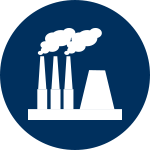
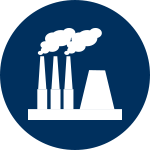
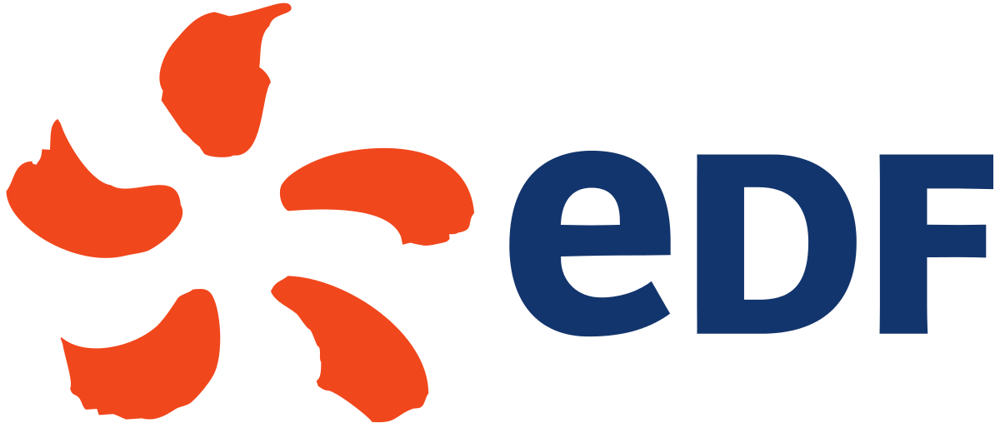
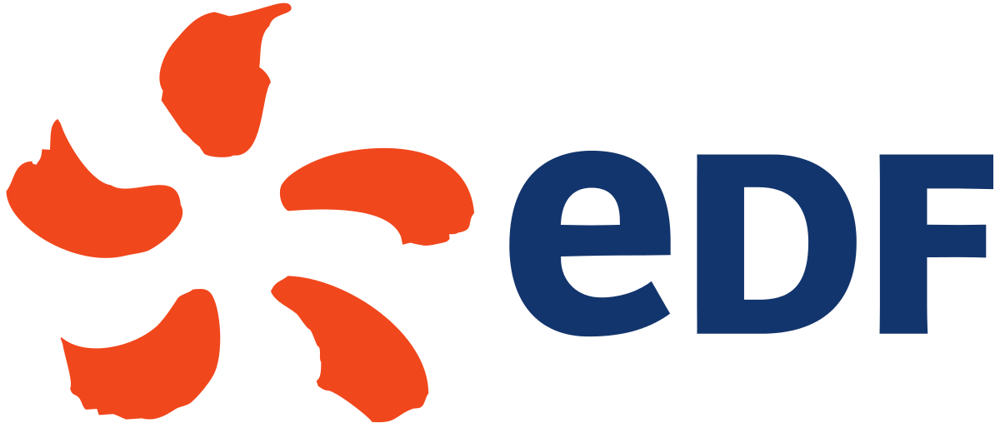
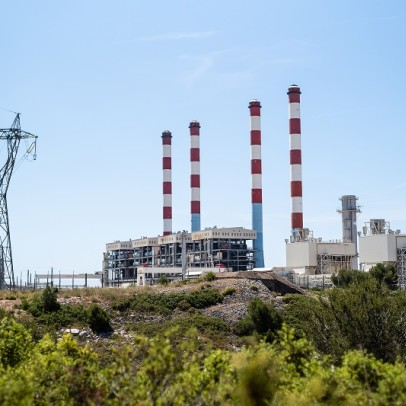
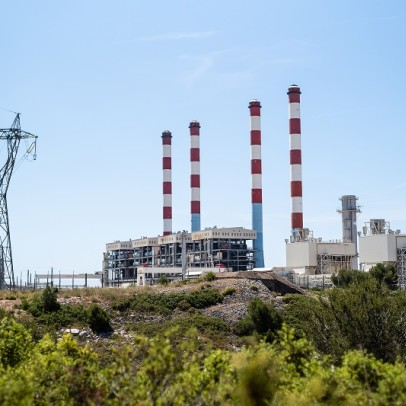

In [ ]:
# coding=utf-8
# à utiliser
from selenium import webdriver
from selenium.webdriver.firefox.options import Options
from selenium.webdriver.firefox.service import Service
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC

"""
Configurer correctement l'environnement du développement :
Etape 1: télécharger selenium version 4+ (ou le plus récent)
    https://pypi.org/project/selenium/

Etape 2 : télécharger webdriver pour firefox
    Télécharger webdriver du site https://github.com/mozilla/geckodriver/releases/
    Dans la rubrique "Assets", télécharger "geckodriver-v0.35.0-win64.zip" (à adapter selon la version de ton système)
    Installer le zip dans le même dossier où il y a ton fichier python pour faciliter l'écriture de la répertoire (tu pourras aussi le mettre dans ton PATH)

Etape 3: l'utilisation de 'user_agent'
    Clique droit sur une page myplantonline
    Clique sur "inspecter"
    Clique sur "network" (réseau en français) dans le devtool -> cliquer sur un des éléments dans la liste ("GET"/"POST") 
    Dans la fenêtre ouvert à droite, trouver le header (en-tête en français) -> trouver 'User-Agent' -> copier coller la valeur

"""

user_agent = 'Mozilla/5.0 (Windows NT 10.0; Win64; x64; EDF; rv:102.0) Gecko/20100101 Firefox/102.0'

firefox_driver = "geckodriver.exe"
firefox_service = Service(firefox_driver)
firefox_options = Options()
firefox_options.set_preference('general.useragent.override', user_agent)

browser=webdriver.Firefox(service=firefox_service, options=firefox_options)
browser.get('https://prod-thaf-vision.edf.fr/PIVision/#/Displays/1788')

# wait = WebDriverWait(browser, 20)

try: 
    wait = WebDriverWait(browser, 20)
    # le browser reste ouvert jusqu'à qu'on trouve tous les div qui contiennent ce class
    div_parent = wait.until(EC.presence_of_all_elements_located((By.XPATH, '//*[contains(@class, "symbol-mouse-drop symbol-host editor-symbol-host shape ui-droppable")]')))
    # le browser reste ouvert jusqu'à qu'on trouve tous les div qui commence par 'Symbolxx'
    # elements = wait.until(EC.presence_of_all_elements_located((By.XPATH, '//*[starts-with(@id, "Symbol")]')))
    
    for element in div_parent:
        element_id = element.get_attribute('id')
        element_title = element.get_attribute('title')
        outer_html = element.get_attribute('outerHTML')
        inner_html = element.get_attribute('innerHTML')

        # parser l'innerHTML pour récupérer les div sousjacents
        div_children = element.find_elements(By.XPATH, './/div')
        div_child_name =None
        div_child_data=[]
        for div_child in div_children:
            div_child_class = div_child.get_attribute('class')
            div_child_data.append(div_child_class)
        if 'static-text-symbol link' in (div_child_class or ''):
            div_child_name = div_child.text
            #break
        if not div_child_name:
            div_child_name = 'No text found'

        print(f"ID: {element_id}\ntitle: {element_title}\nOuter HTML: {outer_html}\nInner HTML:{inner_html}\nDiv sousjacent: {div_child_data}\nText:{div_child_name}\n")

finally:
    browser.quit()



outer HTML: <div id="footer-splitter-container" class="flex-auto flex-container-column k-widget k-splitter" kendo-splitter="" k-panes="[{scrollable:false}, {scrollable:true}]" k-orientation="'vertical'" data-role="splitter">

            <div id="display-splitter-container" class="flex-container-column flex-auto c-display-splitter-container k-widget k-splitter k-pane" kendo-splitter="" k-panes="[{scrollable:false}, {size:'270px', collapsible:false, collapsed:true, scrollable:false}]" k-orientation="'horizontal'" k-resize="shellCtrl.onResizeCenterPane" data-role="splitter" role="group" style="position: absolute; top: 0px; height: 737px; width: 1221px;">

                <div id="center-pane" class="flex-container-column flex-auto k-pane" role="group" style="position: absolute; top: 0px; width: 1221px; height: 737px; left: 0px;">
                    <!----><div id="ui-view-content" ui-view="content" class="flex-container-column flex-auto" style="height:100%">
<div id="content-pane" class
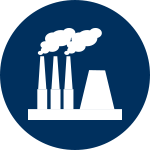
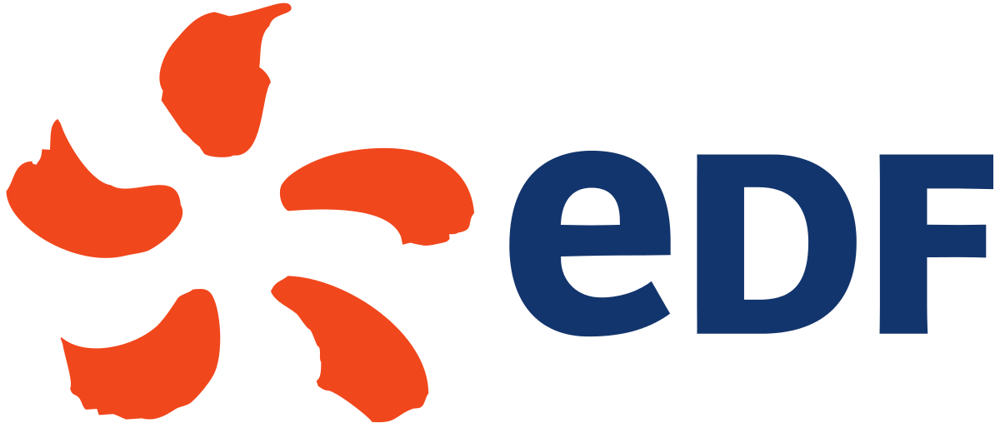

In [10]:
from selenium import webdriver
from selenium.webdriver.firefox.options import Options
from selenium.webdriver.firefox.service import Service
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC


user_agent = 'Mozilla/5.0 (Windows NT 10.0; Win64; x64; EDF; rv:102.0) Gecko/20100101 Firefox/102.0'

firefox_driver = "geckodriver.exe"
firefox_service = Service(firefox_driver)
firefox_options = Options()
firefox_options.set_preference('general.useragent.override', user_agent)

browser=webdriver.Firefox(service=firefox_service, options=firefox_options)
browser.get('https://prod-thaf-vision.edf.fr/PIVision/#/Displays/1788')

try: 
    wait = WebDriverWait(browser, 50)
    # le browser reste ouvert jusqu'à qu'on trouve tous les div qui contiennent ce class
    # div_parent = wait.until(EC.presence_of_all_elements_located((By.XPATH, '//*[contains(@class, "symbol-mouse-drop symbol-host editor-symbol-host shape ui-droppable")]')))
    # le browser reste ouvert jusqu'à qu'on trouve tous les div qui commence par 'Symbolxx'
    div_parent = wait.until(EC.presence_of_all_elements_located((By.XPATH, '//*[starts-with(@id, "footer-splitter-container")]')))

    for element in div_parent:
        # element_id = element.get_attribute('id')
        # element_title = element.get_attribute('title')
        outer_html = element.get_attribute('outerHTML')
        inner_html = element.get_attribute('innerHTML')
    
        print(f"outer HTML: {outer_html}\n")

finally:
    browser.quit()

In [ ]:
# tranformer en excel


In [12]:
# utilisation de regrex

import re

# html = '''
# <div class="symbol-mouse-drop symbol-host editor-symbol-host shape ui-droppable" id="Symbol31" style="position: absolute; left: 31.72px; top: 114.33px; width: 150px; height: 15.69px; transform: rotate(0deg); z-index: auto;" title="">
#   <div class="symbol-template-parent">
#     <div class="static-text-symbol link" title="Link to display: 1779" style="background-color: rgba(255, 255, 255, 0); font-size: 13.3333px; color: rgb(104, 104, 104);">
#       02 - Efficacité énergétique
#     </div>
#   </div>
# </div>

# <div class="symbol-mouse-drop symbol-host editor-symbol-host shape ui-droppable" id="Symbol31" style="position: absolute; left: 31.72px; top: 114.33px; width: 150px; height: 15.69px; transform: rotate(0deg); z-index: auto;" title="Link to display: 1780">
#   <div class="symbol-template-parent">
#     <div class="static-text-symbol link" style="background-color: rgba(255, 255, 255, 0); font-size: 13.3333px; color: rgb(104, 104, 104);">
#       02 - Efficacité énergétique
#     </div>
#   </div>
# </div>
# '''


# Regular expression to find the title attribute
# Regular expression to find all title attributes
title_pattern = r'title="([^"]*)"'

# Find all title attributes
titles = re.findall(title_pattern, outer_html)

# Process each title value
results = []
for title in titles:
    if title =="":  # Check if title is empty
        results.append("")
    elif title.startswith("Link to display:"):  # Check for the specific pattern
        # Extract value after ":"
        link_value = title.split(":", 1)[1].strip()
        results.append(link_value)
    else:
        # Skip titles not matching the conditions
        continue

# Display the results
print("Processed titles:")
for result in results:
    print(result)

Processed titles:

1799
1822
70
































1800
1798
2228
1795
1797





















































1790
















1803


















1540


582


1991








































1707











In [9]:
import re

"""
quelque soit que le title == "" ou pas, acces to class "static-text-symbol link" et get le text

"""

# Regular expression to find <div> blocks with title atributes
div_pattern = r'(<div[^>]*title="([^"]*)".*?>.*?</div>)'

# regular expression to find the most nested <div> and its text
nested_div_pattern = r'<div[^>]*>([^<]*)</div>'

# Find all title attributes
divs = re.findall(div_pattern, outer_html)

# for div in divs:
#     print(div)


# # Process each title value
results = []
for div, title in divs:
    if not title:  # Check if title is empty
        title_value=""
    elif title.startswith("Link to display:"):  # Check for the specific pattern
        # Extract value after ":"
        title_value = title.split(":", 1)[1].strip()
        results.append(title_value)
    else:
        # Skip titles not matching the conditions
        continue

    # find the text of the most nested <div>
    nested_div=re.findall(nested_div_pattern, div)
    if nested_div:
        nested_div_text=nested_div[-1].strip()
        
    else:
        nested_div_text=""
        

    results.append({"div":div.strip(), "title value": title_value, "text": nested_div_text})
    print(results)
# # Display the results
# for result in results:
#     print(f"Div: {result['div']}")
#     print(f"Title: {result['title value']}")
#     print(f"Nested Text: {result['text']}")
    

[{'div': '<div class="symbol-mouse-drop symbol-host editor-symbol-host shape ui-droppable" id="Symbol5" style="position: absolute; left: 0.955161px; top: 41.69px; width: 1931.2px; height: 4px; transform: rotate(0deg); z-index: auto;" title=""> <div class="symbol-template-parent"><svg style="position: absolute; height: 100%; width: 100%; top: 0px; left: 0px; overflow: visible; color: rgb(205, 208, 219);" stroke-width="12"><path d="M0,2 L1929.2,0" stroke="currentColor" stroke-dasharray=""></path></svg></div>', 'title value': '', 'text': ''}]
[{'div': '<div class="symbol-mouse-drop symbol-host editor-symbol-host shape ui-droppable" id="Symbol5" style="position: absolute; left: 0.955161px; top: 41.69px; width: 1931.2px; height: 4px; transform: rotate(0deg); z-index: auto;" title=""> <div class="symbol-template-parent"><svg style="position: absolute; height: 100%; width: 100%; top: 0px; left: 0px; overflow: visible; color: rgb(205, 208, 219);" stroke-width="12"><path d="M0,2 L1929.2,0" stro

In [66]:
from selenium import webdriver
from selenium.webdriver.firefox.options import Options
from selenium.webdriver.firefox.service import Service

# User agent string
user_agent = 'Mozilla/5.0 (Windows NT 10.0; Win64; x64; EDF; rv:102.0) Gecko/20100101 Firefox/102.0'

# Path to the Firefox driver executable
firefox_driver = "geckodriver.exe"
firefox_service = Service(firefox_driver)

# Set up Firefox options
options = Options()
options.set_preference("general.useragent.override", user_agent)  # Set the custom user-agent
options.add_argument('--headless')  # Run in headless mode (optional)

# Initialize the WebDriver
driver = webdriver.Firefox(service=firefox_service, options=options)

# URL to render
url = "http://www.python.org"

try:
    # Load the webpage
    driver.get(url)
    
    # Wait for the page to load (adjust time as needed)
    driver.implicitly_wait(10)
    
    # Print the page title
    print("Page Title:", driver.title)
    
    # Print the page source (optional)
    print(driver.page_source)
    
finally:
    # Quit the driver
    driver.quit()


Page Title: Notification proxy
<html><!-- FileName: index.html
     Language: [en]
--><!--Head--><head>
  <meta content="text/html; charset=UTF-8" http-equiv="Content-Type">
  <title>Notification proxy</title>
  <link rel="icon" type="image/png" href="data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAABAAAAAQCAYAAAAf8/9hAAAABmJLR0QA/wD/AP+gvaeTAAAA CXBIWXMAAC4jAAAuIwF4pT92AAAAB3RJTUUH4QscCiY57Z81SwAAAdhJREFUOMtt0ztsjXEY BvDfOU6Ixi2lEREVihAhymao6R8Jickl8i1iMRhZDIiFjYGFheW/NRHXhC9YtLFJ2qQlbk2k LnWpBi2ijqFvm6PxJf/le97nvT3PW1GUVdTlVDf9K8oOLMYNOf2YhlWh8h/SfCzFduzFbNzE VTyX00hjeEVRLsQWLMNctGIjqkF6i31Yjh704zM+oqeGnTiK7wG+x2V0y+lVdPUQm7EB67EE K9FZw4LIdhLdmCmnsX/GyukdbivKXnxFC46jpRYtjqJPTuMYi6oVzJDTb0U5B4cxLKdL+KIo X+NnFYNoxtppVeuYVGZH7OFTJG+LMd7UYuYPaEOXohTgiJxGFWUrDuJBLBVWhLzPqhjCC7Qr yoqc4ACOKMp52B9SnpfTn0iwGrPQX5XTVzzGJqyKgD5sxS3sDvJAtL8A7eiV01A1CF0Yx66Y /xouYCF65NTZsJ0OrMMNYRZyeonr2KMot8S/yeonGlzaHOM9ldP9iQRFWQv4CgZwWlGuiSR9 choMchPOYBHONVq5MiVbUa4OcDYu4h5+hdUPhc1PyenupFcqU5c1ueEJ2Y7FUp/gW3hkG